# TinySim MountainCar: Notebook DQN Policy Playground

This notebook lets you **load your trained MountainCar DQN checkpoint** and see how it performs on multiple TinySim physics settings.

It includes:
- quick checkpoint loading
- baseline + custom physics scenarios
- gravity/force interval sweeps from default to deterministic limits
- trajectory plots
- optional live widget playback in notebook


In [10]:
# Setup
from pathlib import Path
import sys
import numpy as np
import torch
import matplotlib.pyplot as plt

# Make sure we can import common.py from TinySim/
PROJECT_DIR = Path.cwd()
if not (PROJECT_DIR / 'common.py').exists():
    PROJECT_DIR = Path('/home/buchkeva/IdeaTesting/TinySim')

if str(PROJECT_DIR) not in sys.path:
    sys.path.insert(0, str(PROJECT_DIR))

import common as ts_common
from tinysim.mountain_car import MountainCarEnv

print(f'Project dir: {PROJECT_DIR}')
print(f'Torch: {torch.__version__}')
print(f'CUDA available: {torch.cuda.is_available()}')


Project dir: /home/buchkeva/IdeaTesting/TinySim
Torch: 2.10.0+cu128
CUDA available: True


In [11]:
# Checkpoint + model loading
CHECKPOINT_PATH = PROJECT_DIR / 'mountain_car_saved' / 'mountain_car_dqn.pt'
HIDDEN_DIM = 128
DEVICE = 'cpu'  # For this tiny policy/env, CPU is usually fastest

if not CHECKPOINT_PATH.exists():
    raise FileNotFoundError(f'Checkpoint not found: {CHECKPOINT_PATH}')

q_net = ts_common._load_notebook_q_network(
    checkpoint_path=str(CHECKPOINT_PATH),
    hidden_dim=HIDDEN_DIM,
    device=DEVICE,
)
print(f'Loaded checkpoint: {CHECKPOINT_PATH}')


Loaded checkpoint: /home/buchkeva/IdeaTesting/TinySim/mountain_car_saved/mountain_car_dqn.pt


In [ ]:
# Easy-to-edit physics scenarios
# These are the same baseline-style variants we used before.
SCENARIOS = {
    'baseline': {},
    'g1': {'gravity': 0.0030},
    'g2': {'gravity': 0.0040},
    'g3': {'gravity': 0.00515228},
    'f1': {'force': 0.0007},
    'f2': {'force': 0.0005},
    'f3': {'force': 0.0003},
}

MAX_EPISODE_STEPS = 400
EPISODES_PER_SCENARIO = 20
RANDOM_START = False


In [13]:
# Rollout helpers

def _apply_params(sim_env, params):
    for k, v in params.items():
        if not hasattr(sim_env, k):
            raise AttributeError(f"MountainCarEnv has no parameter '{k}'")
        setattr(sim_env, k, float(v))


def run_single_rollout(q_net, params=None, max_steps=400, random_start=False, device='cpu'):
    params = params or {}
    sim_env = MountainCarEnv()
    _apply_params(sim_env, params)

    state = ts_common._reset_sim_state(sim_env, random_start=random_start)
    obs = ts_common._state_to_obs(state)

    positions = [float(state['position'])]
    velocities = [float(state['velocity'])]
    actions = []

    done = bool(state['done'])
    steps = 0

    while (not done) and steps < max_steps:
        obs_t = torch.as_tensor(obs, dtype=torch.float32, device=device).unsqueeze(0)
        with torch.no_grad():
            action = int(torch.argmax(q_net(obs_t), dim=1).item())

        state = sim_env.step(action)
        obs = ts_common._state_to_obs(state)

        actions.append(action)
        positions.append(float(state['position']))
        velocities.append(float(state['velocity']))

        done = bool(state['done'])
        steps += 1

    return {
        'solved': done,
        'steps': steps,
        'final_position': float(state['position']),
        'positions': np.array(positions),
        'velocities': np.array(velocities),
        'actions': np.array(actions),
    }


def evaluate_scenarios(q_net, scenarios, episodes=20, max_steps=400, random_start=False, device='cpu'):
    rows = []
    for name, params in scenarios.items():
        solved = 0
        steps = []
        final_pos = []
        for _ in range(episodes):
            out = run_single_rollout(
                q_net=q_net,
                params=params,
                max_steps=max_steps,
                random_start=random_start,
                device=device,
            )
            solved += int(out['solved'])
            steps.append(out['steps'])
            final_pos.append(out['final_position'])

        rows.append({
            'scenario': name,
            'params': params,
            'success_rate': solved / episodes,
            'mean_steps': float(np.mean(steps)),
            'mean_final_position': float(np.mean(final_pos)),
        })

    return rows


Scenario            Success%  MeanSteps  MeanFinalPos   Params
------------------------------------------------------------------------------------------
baseline              100.0%      144.0         0.537   {}
weaker_engine         100.0%      157.0         0.513   {'force': 0.0008}
stronger_engine       100.0%       79.0         0.502   {'force': 0.0012}
lower_gravity         100.0%       86.0         0.526   {'gravity': 0.002}
higher_gravity        100.0%      133.0         0.512   {'gravity': 0.003}


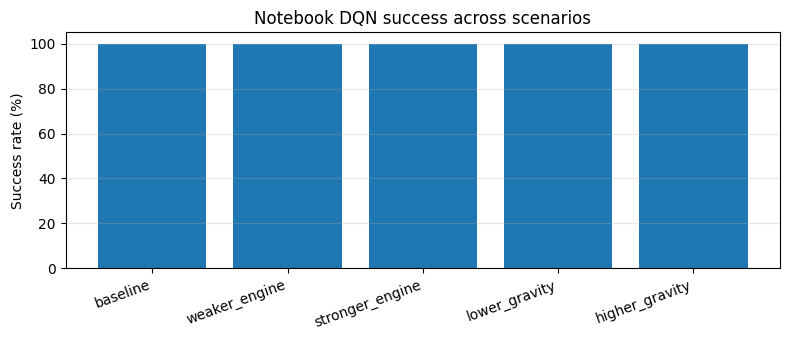

In [14]:
# Evaluate baseline/custom scenarios
rows = evaluate_scenarios(
    q_net=q_net,
    scenarios=SCENARIOS,
    episodes=EPISODES_PER_SCENARIO,
    max_steps=MAX_EPISODE_STEPS,
    random_start=RANDOM_START,
    device=DEVICE,
)

print(f"{'Scenario':<18} {'Success%':>9} {'MeanSteps':>10} {'MeanFinalPos':>13}   Params")
print('-' * 90)
for r in rows:
    print(
        f"{r['scenario']:<18} "
        f"{100*r['success_rate']:>8.1f}% "
        f"{r['mean_steps']:>10.1f} "
        f"{r['mean_final_position']:>13.3f}   "
        f"{r['params']}"
    )

# Quick bar chart
plt.figure(figsize=(8, 3.5))
plt.bar([r['scenario'] for r in rows], [100*r['success_rate'] for r in rows])
plt.ylabel('Success rate (%)')
plt.title('Notebook DQN success across scenarios')
plt.xticks(rotation=20, ha='right')
plt.ylim(0, 105)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


## Interval Sweep Between Deterministic Limits

This uses the deterministic search already implemented in `common.py` to find:
- maximum solvable gravity at fixed force
- minimum solvable force at fixed gravity

Then it evaluates your learned notebook policy at evenly spaced intervals between defaults and those bounds.


In [15]:
# Interval sweep (same logic as CLI command)
POINTS = 10
EPISODES_PER_POINT = 20

interval_result = ts_common.sweep_notebook_dqn_between_deterministic_limits(
    checkpoint_path=str(CHECKPOINT_PATH),
    points=POINTS,
    episodes_per_point=EPISODES_PER_POINT,
    max_episode_steps=MAX_EPISODE_STEPS,
    random_start=RANDOM_START,
    hidden_dim=HIDDEN_DIM,
    device=DEVICE,
)


[TinySim] Deterministic physics limit search
Strategy: push forward -> backward -> forward (velocity zero-crossings).
Search mode: increase gravity from default, decrease force from default.
------------------------------------------------------------------------------------------
[TinySim] Max solvable gravity at force=0.00100000: 0.00328003
[TinySim] Min solvable force at gravity=0.00250000: 0.00076211
------------------------------------------------------------------------------------------
[TinySim][NotebookDQN] Interval solvability sweep between deterministic limits
Checkpoint=/home/buchkeva/IdeaTesting/TinySim/mountain_car_saved/mountain_car_dqn.pt | points=10 | episodes_per_point=20
Gravity sweep: 0.00250000 -> 0.00328003 (force fixed at 0.00100000)
Force sweep:   0.00100000 -> 0.00076211 (gravity fixed at 0.00250000)

[Gravity Increase Sweep]
     gravity   success%   mean_steps   mean_final_pos
--------------------------------------------------------
  0.00250000      100.0   

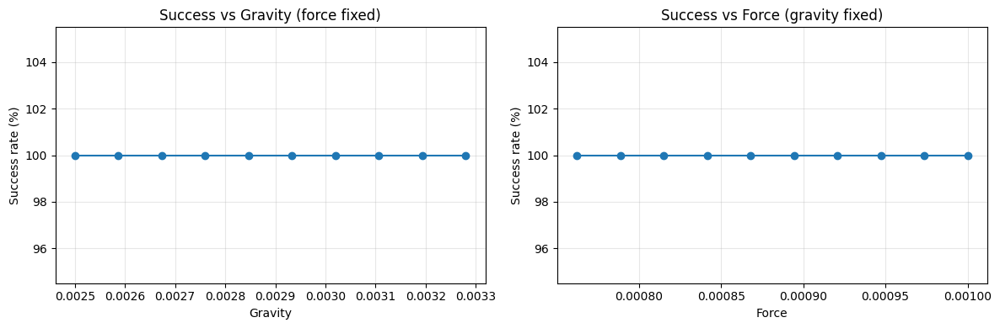

In [16]:
# Plot interval sweep curves
gravity_rows = interval_result['gravity_rows']
force_rows = interval_result['force_rows']

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot([r['gravity'] for r in gravity_rows], [100*r['success_rate'] for r in gravity_rows], marker='o')
axes[0].set_title('Success vs Gravity (force fixed)')
axes[0].set_xlabel('Gravity')
axes[0].set_ylabel('Success rate (%)')
axes[0].grid(True, alpha=0.3)

axes[1].plot([r['force'] for r in force_rows], [100*r['success_rate'] for r in force_rows], marker='o')
axes[1].set_title('Success vs Force (gravity fixed)')
axes[1].set_xlabel('Force')
axes[1].set_ylabel('Success rate (%)')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


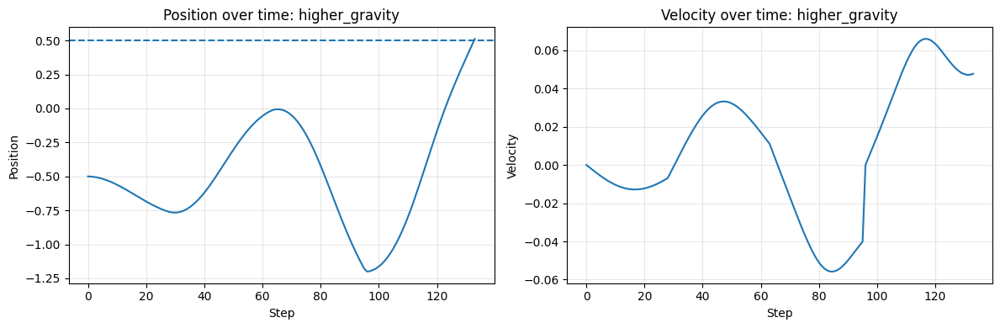

Solved: True | Steps: 133 | Final pos: 0.512


In [17]:
# Trajectory visualization for one scenario
SCENARIO_TO_PLOT = 'higher_gravity'  # edit

out = run_single_rollout(
    q_net=q_net,
    params=SCENARIOS[SCENARIO_TO_PLOT],
    max_steps=MAX_EPISODE_STEPS,
    random_start=RANDOM_START,
    device=DEVICE,
)

positions = out['positions']
velocities = out['velocities']

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].plot(positions)
axes[0].axhline(0.5, linestyle='--')
axes[0].set_title(f"Position over time: {SCENARIO_TO_PLOT}")
axes[0].set_xlabel('Step')
axes[0].set_ylabel('Position')
axes[0].grid(True, alpha=0.3)

axes[1].plot(velocities)
axes[1].set_title(f"Velocity over time: {SCENARIO_TO_PLOT}")
axes[1].set_xlabel('Step')
axes[1].set_ylabel('Velocity')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Solved: {out['solved']} | Steps: {out['steps']} | Final pos: {out['final_position']:.3f}")


## Playback (Lab3 Style)

This follows the same playback style as your other notebook:
- record per-step frames
- animate with `matplotlib.animation.FuncAnimation`
- display inline with `HTML(ani.to_jshtml())`


In [18]:
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas


def render_tinysim_state_frame(position, min_position=-1.2, max_position=0.6, goal_position=0.5):
    """Render a TinySim MountainCar state to an RGB frame (numpy array)."""
    fig, ax = plt.subplots(figsize=(6, 4), dpi=100)

    x = np.linspace(min_position, max_position, 500)
    y = np.sin(3 * x)
    car_y = np.sin(3 * position)

    ax.plot(x, y, color='black', linewidth=2)
    ax.scatter([position], [car_y], s=200, c='crimson', zorder=5)

    # Goal marker
    gx = goal_position
    gy = np.sin(3 * gx)
    ax.plot([gx, gx], [gy, gy + 0.2], color='black', linewidth=2)
    ax.fill([gx, gx + 0.06, gx], [gy + 0.2, gy + 0.17, gy + 0.14], color='gold')

    ax.set_xlim(min_position - 0.05, max_position + 0.05)
    ax.set_ylim(-1.25, 1.25)
    ax.set_title('TinySim MountainCar Policy Playback')
    ax.set_xlabel('Position')
    ax.set_ylabel('Height')
    ax.grid(alpha=0.3)

    canvas = FigureCanvas(fig)
    canvas.draw()
    frame = np.asarray(canvas.buffer_rgba())[..., :3].copy()
    plt.close(fig)
    return frame


def record_tinysim_episode_frames(q_net, params, max_steps=400, random_start=False, device='cpu'):
    """Run one TinySim rollout and return frames + summary."""
    sim_env = MountainCarEnv()
    _apply_params(sim_env, params)

    state = ts_common._reset_sim_state(sim_env, random_start=random_start)
    obs = ts_common._state_to_obs(state)

    frames = [
        render_tinysim_state_frame(
            position=float(state['position']),
            min_position=sim_env.min_position,
            max_position=sim_env.max_position,
            goal_position=sim_env.goal_position,
        )
    ]

    done = bool(state['done'])
    steps = 0

    while (not done) and steps < max_steps:
        obs_t = torch.as_tensor(obs, dtype=torch.float32, device=device).unsqueeze(0)
        with torch.no_grad():
            action = int(torch.argmax(q_net(obs_t), dim=1).item())

        state = sim_env.step(action)
        obs = ts_common._state_to_obs(state)
        done = bool(state['done'])
        steps += 1

        frames.append(
            render_tinysim_state_frame(
                position=float(state['position']),
                min_position=sim_env.min_position,
                max_position=sim_env.max_position,
                goal_position=sim_env.goal_position,
            )
        )

    summary = {
        'solved': done,
        'steps': steps,
        'final_position': float(state['position']),
        'n_frames': len(frames),
    }
    return frames, summary


# Edit these and run:
SCENARIO_TO_PLAY = 'baseline'  # any key from SCENARIOS
ANIMATION_INTERVAL_MS = 20

frames, playback_summary = record_tinysim_episode_frames(
    q_net=q_net,
    params=SCENARIOS[SCENARIO_TO_PLAY],
    max_steps=MAX_EPISODE_STEPS,
    random_start=RANDOM_START,
    device=DEVICE,
)

fig, ax = plt.subplots(figsize=(6, 4))
ax.axis('off')
img = ax.imshow(frames[0])


def update(frame):
    img.set_data(frame)
    return [img]

ani = animation.FuncAnimation(
    fig,
    update,
    frames=frames,
    interval=ANIMATION_INTERVAL_MS,
    blit=True,
)
plt.close(fig)

print(playback_summary)
HTML(ani.to_jshtml())


{'solved': True, 'steps': 144, 'final_position': 0.5368578257757776, 'n_frames': 145}


## Deterministic Controller Playback

This visualizes the **deterministic loop controller** (not the learned policy):
- push forward until velocity crosses back to `<= 0`
- push backward until velocity crosses back to `>= 0`
- repeat until goal is reached or `max_steps` is hit

Use this to compare hand-designed control vs learned-policy behavior on the same physics.


In [19]:
import matplotlib.animation as animation
from IPython.display import HTML


def record_deterministic_loop_frames(params, max_steps=400, random_start=False):
    """Record one rollout using deterministic forward/backward loop controller."""
    sim_env = MountainCarEnv()
    _apply_params(sim_env, params)

    state = ts_common._reset_sim_state(sim_env, random_start=random_start)

    frames = [
        render_tinysim_state_frame(
            position=float(state['position']),
            min_position=sim_env.min_position,
            max_position=sim_env.max_position,
            goal_position=sim_env.goal_position,
        )
    ]

    action = 2  # start by pushing forward
    seen_positive_velocity = False
    seen_negative_velocity = False

    done = bool(state['done'])
    steps = 0
    actions = []

    while (not done) and steps < max_steps:
        vel = float(state['velocity'])

        if action == 2:
            if vel > 0:
                seen_positive_velocity = True
            if seen_positive_velocity and vel <= 0:
                action = 0
                seen_positive_velocity = False
                seen_negative_velocity = False
        else:
            if vel < 0:
                seen_negative_velocity = True
            if seen_negative_velocity and vel >= 0:
                action = 2
                seen_positive_velocity = False
                seen_negative_velocity = False

        state = sim_env.step(action)
        done = bool(state['done'])
        steps += 1
        actions.append(action)

        frames.append(
            render_tinysim_state_frame(
                position=float(state['position']),
                min_position=sim_env.min_position,
                max_position=sim_env.max_position,
                goal_position=sim_env.goal_position,
            )
        )

    summary = {
        'solved': done,
        'steps': steps,
        'final_position': float(state['position']),
        'n_frames': len(frames),
        'mean_action': float(np.mean(actions)) if actions else None,
    }
    return frames, summary


# Edit and run:
DET_SCENARIO_TO_PLAY = 'baseline'      # any key from SCENARIOS
DET_MAX_STEPS = MAX_EPISODE_STEPS
DET_RANDOM_START = RANDOM_START
DET_ANIMATION_INTERVAL_MS = 20

frames_det, summary_det = record_deterministic_loop_frames(
    params=SCENARIOS[DET_SCENARIO_TO_PLAY],
    max_steps=DET_MAX_STEPS,
    random_start=DET_RANDOM_START,
)

fig, ax = plt.subplots(figsize=(6, 4))
ax.axis('off')
img = ax.imshow(frames_det[0])


def update_det(frame):
    img.set_data(frame)
    return [img]

ani_det = animation.FuncAnimation(
    fig,
    update_det,
    frames=frames_det,
    interval=DET_ANIMATION_INTERVAL_MS,
    blit=True,
)
plt.close(fig)

print({'scenario': DET_SCENARIO_TO_PLAY, **summary_det})
HTML(ani_det.to_jshtml())


{'scenario': 'baseline', 'solved': True, 'steps': 124, 'final_position': 0.5349499721889489, 'n_frames': 125, 'mean_action': 1.2580645161290323}
